Машинско учење је подобласт вештачке интелигнеције.
Бави се извођењем алгоритама из података, без експлицитног програмирања.
Као сто се логика бави дедукцијом и формализује вид људског закључивања, тако се машинско учење бави индукцијом тј. генерализацијом и тиме формализује други вид људског закључивања - уопштавање од ограниченог броја узорака ка универзалним закључцима.

Још неки од проблема које решава машинско учење су:
- препознавање различитих објеката на сликама и видеима
- препознавање тумора на медицинским сликама
- аутономна вожња аутомобила
- играње игара попут шаха, GO, Super Mario..
- класификација текста
- машинско превођење језика
- анализа друштвених мрежа...

<img src="https://www.twipemobile.com/wp-content/uploads/2018/06/Weekly-Twitter-Posts-1-5.png" alt="MAsinsko ucenje">
<h1> Neuronska mreža </h1>
<h2>Gusto povezana neuronska mreža:</h2>
<img src="https://smltar.com/diagram-files/dnn-architecture.png" alt="Dense Neural Network">
<h2>Kako izgleda jedan neuron:</h2>
<img src="https://assets-global.website-files.com/5d7b77b063a9066d83e1209c/614fc05e2486109794ed3bdc_neuron.png" alt="Single Neuron">
<h2>Aktivacione funkcije:</h2>
<img src="https://assets-global.website-files.com/5d7b77b063a9066d83e1209c/60be4975a399c635d06ea853_hero_image_activation_func_dark.png" alt="Activation Functions">
<img src="slika1.png" alt="oblici koje prepoznaje">
<img src="slika4.png" alt="Konvolucija">
<img src="slika7.png" alt="oblici koje prepoznaje">
<img src="https://production-media.paperswithcode.com/methods/MaxpoolSample2.png" alt="MaxPool">
<img src="slika5.png" alt="Jedan filter">
<img src="slika2.png" alt="Архитектура">
<img src="slika6.png" alt="oblici koje prepoznaje">

<h1>Zadatak: napraviti model koji na osnovu rendgenskog snimka može ustanoviti da li osoba ima upalu pluća.</h1>

In [1]:
from os import listdir, path
from matplotlib import pyplot as plt
from PIL import Image

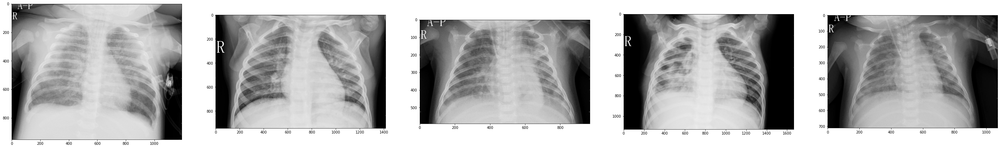

In [2]:
example_dir = "../chest_xray/val/PNEUMONIA/"
examples = listdir(example_dir)[:5]
examples = map(lambda file: path.join(example_dir, file), examples)
examples = map(Image.open, examples)
_, axs = plt.subplots(1, 5, figsize=(50, 45))

for i, img in enumerate(examples):
    axs[i].imshow(img, cmap='Greys_r')
plt.show()

<h1>Problem: slike su različitih dimenzija</h1>

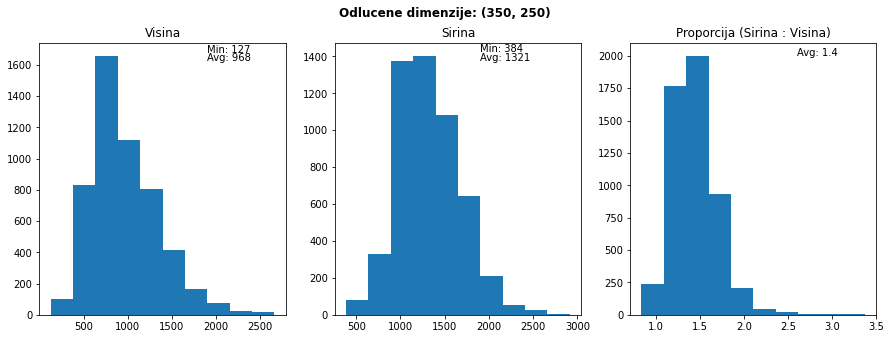

In [3]:
import histogrami
histogrami.main()

In [4]:
example_wide = [
    Image.open("../chest_xray/train/PNEUMONIA/person486_virus_990.jpeg"),
    Image.open("../chest_xray_norm/train/PNEUMONIA/person486_virus_990.jpeg")
]

_, axs = plt.subplots(1, 2, figsize=(350,250), gridspec_kw={'width_ratios': [3,1]})

for i, img in enumerate(example_wide):
    axs[i].imshow(img, cmap='Greys_r')
plt.show()

In [5]:
example_tall = [
    Image.open("../chest_xray/train/NORMAL/IM-0250-0001.jpeg"),
    Image.open("../chest_xray_norm/train/NORMAL/IM-0250-0001.jpeg")
]

_, axs = plt.subplots(1, 2, figsize=(350,250), gridspec_kw={'width_ratios': [3,1]})

for i, img in enumerate(example_tall):
    axs[i].imshow(img, cmap='Greys_r')
plt.show()

<h1> Problem: ograničen broj slika </h1>

In [17]:
from tensorflow.keras.layers import GaussianNoise, Input, Reshape, Dropout, Flatten
from tensorflow.keras.layers.experimental.preprocessing import Rescaling
from tensorflow import clip_by_value
from tensorflow.keras.layers import Conv2D, MaxPool2D, Dense
from tensorflow.keras.models import Model
from tensorflow.keras.optimizers import Adam
from tensorflow.keras.metrics import Precision, Recall
import numpy as np

In [7]:
def image_in_layer(input_shape):
    input_layer = Input(input_shape)
    rs = Rescaling(scale=1/255)(input_layer)
    gauss = GaussianNoise(2/255)(rs, training=True)
    clip = clip_by_value(gauss, 0, 1)
    output_layer = Rescaling(255)(clip)
    
    model = Model(inputs=[input_layer], outputs=[output_layer])
    model.compile()
    return model

noise = image_in_layer((250, 350))

def noisify(img):
    img_np = noise.predict(np.reshape(np.asarray(img), (1, 250,350)), verbose=0)[0]
    return Image.fromarray(np.array(img_np, dtype=np.uint8))

In [8]:
example = Image.open("../chest_xray_norm/train/NORMAL/NORMAL2-IM-1094-0001-0001.jpeg")
example_noise = noisify(example)

_, axs = plt.subplots(1, 2, figsize=(350, 250))

axs[0].imshow(example, cmap='Greys_r')
axs[1].imshow(example_noise, cmap='Greys_r')

plt.show()

In [9]:
razlika = np.abs(np.asarray(example, dtype=np.int16) - np.asarray(example_noise, dtype=np.int16)).sum()
razlika, razlika/(250*350)

(109999, 1.2571314285714286)

<h1>Kako bi izgledala neuronska mreža koja bi rešavala ovaj problem?</h1>

In [10]:
def make_model(input_shape, learning_rate):
    input_layer = Input(input_shape)
    rs = Rescaling(scale=1/255.0)(input_layer)
    gauss = GaussianNoise(1.5/255.0)(rs)
    clip_input = clip_by_value(gauss, 0, 1)
    reshape_input = Reshape((input_shape[0], input_shape[1], 1))(clip_input)

    c1 = Conv2D(16, (3,3), activation="relu")(reshape_input)
    mp1 = MaxPool2D((3,3))(c1)
    c2 = Conv2D(16, (4,4), activation="relu")(mp1)
    mp2 = MaxPool2D((4,4))(c2)
    c3 = Conv2D(32, (5,5), activation="relu")(mp2)
    mp3 = MaxPool2D((5,5))(c3)
    drop1 = Dropout(0.2)(mp3) 
    flat = Flatten()(drop1)
    
    d1 = Dense(256, activation="relu")(flat)
    d2 = Dense(128, activation="relu")(d1)
    
    drop2 = Dropout(0.3)(d2)
    output_layer = Dense(1, activation="sigmoid")(drop2)
    model = Model(inputs=[input_layer], outputs=[output_layer])
    model.compile(loss="binary_crossentropy", optimizer=Adam(learning_rate=learning_rate), metrics=['accuracy',Precision(), Recall()])
    return model

In [11]:
from mreza import read_history, write_history, get_data

def plot_training(history):
    plt.figure(figsize=(20, 20))
    
    epochs = np.arange(len(history["loss"])) + 1

    plt.subplot(2, 2, 1)
    plt.title('Loss')
    plt.plot(epochs, history['loss'], label='training')
    plt.plot(epochs, history['val_loss'], label='validation')
    plt.legend(loc='best')

    plt.subplot(2, 2, 2)
    plt.title('Accuracy')
    plt.plot(epochs, history['accuracy'], label='training')
    plt.plot(epochs, history['val_accuracy'], label='validation')
    plt.legend(loc='best')

    plt.subplot(2, 2, 3)
    plt.title('Precision')
    plt.plot(epochs, history['precision_1'], label='training')
    plt.plot(epochs, history['val_precision_1'], label='validation')
    plt.legend(loc='best')

    plt.subplot(2, 2, 4)
    plt.title('Recall')
    plt.plot(epochs, history['recall_1'], label='training')
    plt.plot(epochs, history['val_recall_1'], label='validation')
    plt.legend(loc='best')

    plt.show()

1 Physical GPUs, 1 Logical GPUs


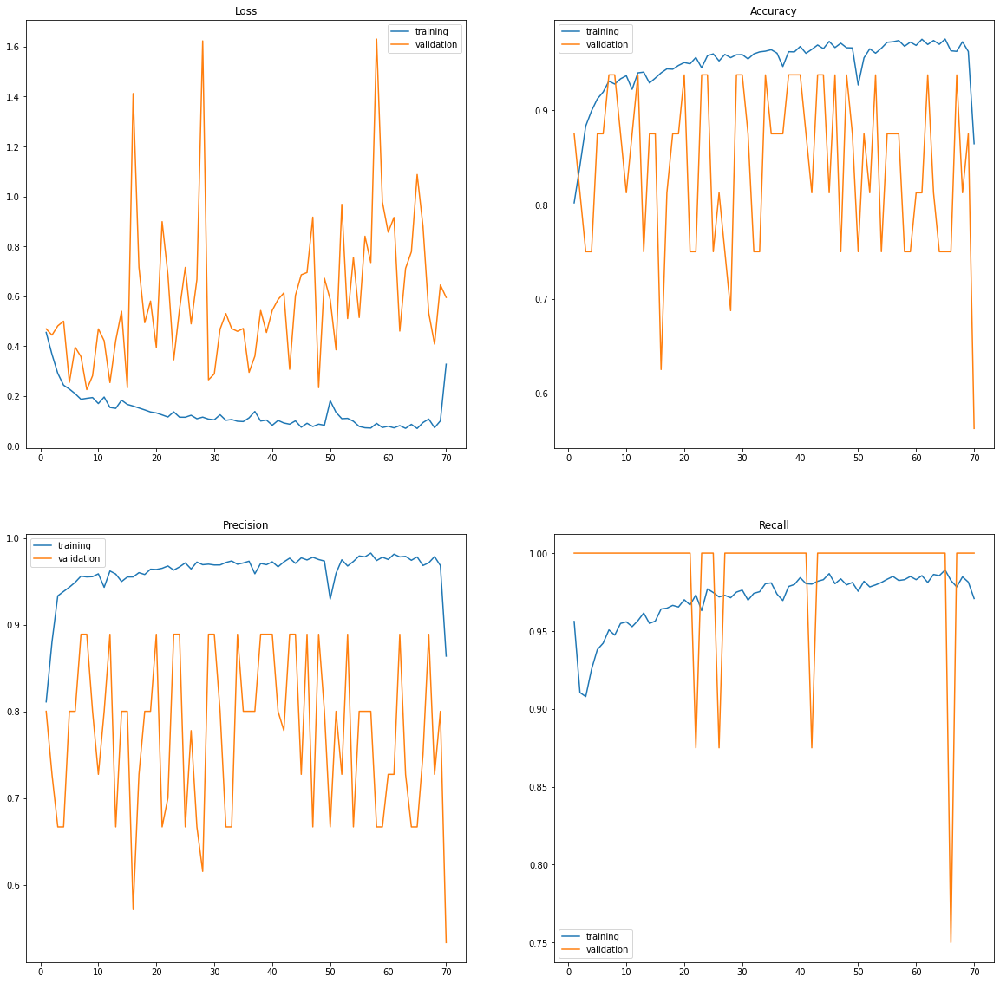

In [12]:
history = read_history("modeli/stefan/model_5_epoha_70.json")
plot_training(history)

In [46]:
model = tf.keras.models.load_model("checkpoints/stefan/model_6_checkpoints/model-069-0.01439.hdf5")
# history = model.fit(
#     x_train, y_train, 
#     epochs=250, batch_size=0, verbose=1, shuffle=True, 
#     validation_data=(x_val,y_val)
# )
x_test, y_test = get_data("../chest_xray_norm/test/")
y_pred = model.predict(x_test) > 0.5
y_pred = np.ravel(y_pred.astype(int))

20/20 [==============================] - 1s 56ms/step


In [47]:
np.average(y_pred==y_test)

0.7836538461538461

In [48]:
from sklearn.metrics import classification_report

In [49]:
print(classification_report(y_test, y_pred))

              precision    recall  f1-score   support

           0       0.96      0.44      0.60       234
           1       0.75      0.99      0.85       390

    accuracy                           0.78       624
   macro avg       0.85      0.71      0.73       624
weighted avg       0.83      0.78      0.76       624

